<a href="https://colab.research.google.com/github/Raihan-J/Data-Compression-And-Encryption/blob/master/Exp-6%20Image%20Compression/Image%20Compression%20(JPEG).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*Sample Image*

In [ ]:
!rm ferrari.*
!wget "https://res.cloudinary.com/dtwr5vm0s/image/upload/v1600165372/Colab/ferrari.jpg"

*Load the Dependencies*

This section loads some required libraries used in this notebook: numpy, pandas, cv2, skimage, PIL, matplotlib, SciPy...

1. Numpy is an array manipulation library, used for linear algebra, Fourier transform, and random number capabilities.
2. Pandas is a library for data manipulation and data analysis.
3. CV2 is a library for computer vision tasks.
4. Skimage is a library which supports image processing applications on python.
5. Matplotlib is a library which generates figures and provides graphical user interface toolkit.
6. SciPy is Python library used for scientific computing and technical computing. SciPy contains modules for optimization, linear algebra, integration, interpolation, special functions, FFT, signal and image processing, ODE solvers and other tasks common in science and engineering

In [2]:
import cv2
import scipy
from scipy import fftpack
from scipy import ndimage
import numpy as np
from numpy import r_
from numpy import pi
import pandas as pd
from skimage import io
from PIL import Image 
from google.colab.patches import cv2_imshow
import matplotlib.pylab as plt

To view Images in Colab

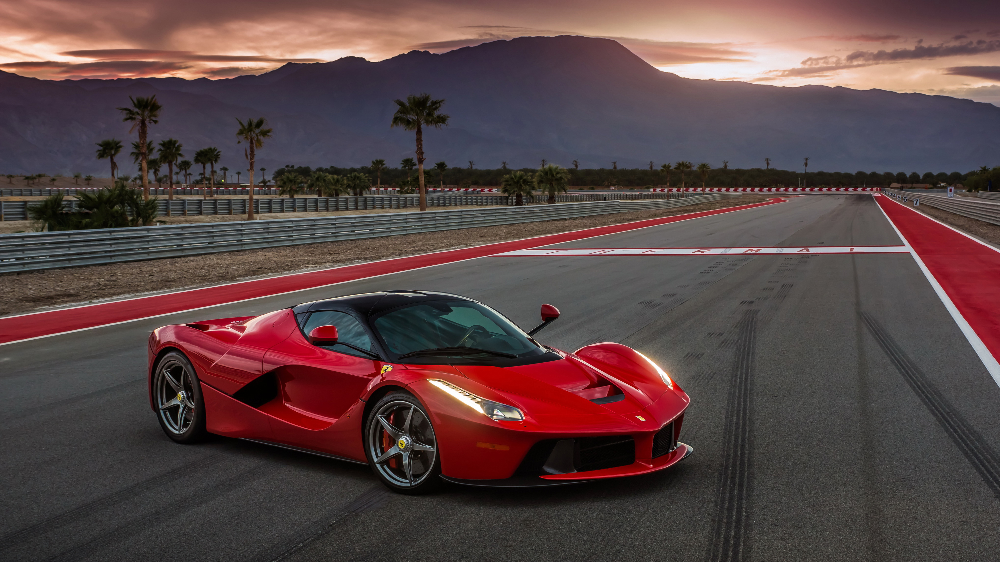

In [3]:
img = cv2.imread('ferrari.jpg', cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

Add Alpha Channel to RGB BGR Image

In [ ]:
img = cv2.imread('ferrari.jpg', cv2.IMREAD_UNCHANGED)
cv2_imshow(cv2.cvtColor(img, cv2.COLOR_BGR2BGRA ))             #add alpha channel to RGB or BGR image(COLOR_BGR2RGB)

In [5]:
 image = io.imread("ferrari.jpg")
# Check the image matrix data type (could know the bit depth of the image)
print(image.dtype)
# Check the height of image 
print(image.shape[0])
# Check the width of image 
print(image.shape[1])
# Check the number of channels of the image
print(image.shape[2])

uint8
2160
3840
3


Display the histogram of R, G, B channel

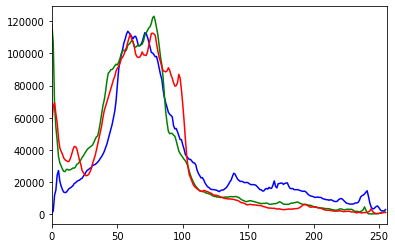

In [6]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

Converting Image To Grayscale

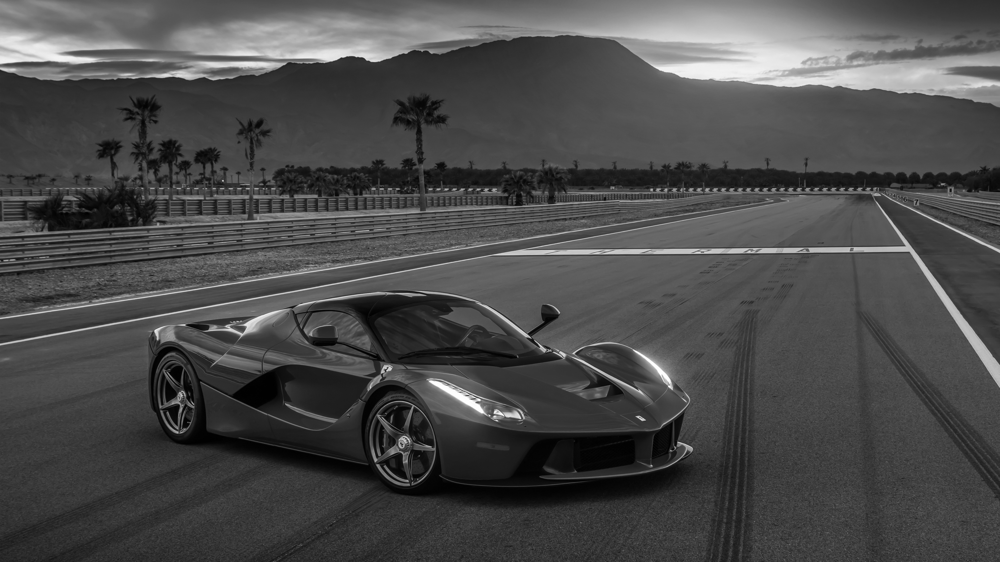

In [7]:
gray_image = cv2.imread('ferrari.jpg', cv2.IMREAD_GRAYSCALE)
cv2.imwrite('grayscale.jpg', gray_image)
cv2_imshow(gray_image)

In [ ]:
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

To see Image Properties

In [9]:
img = cv2.imread('grayscale.jpg')

print("Image Properties")
print("- Number of Pixels: " + str(img.size))
print("- Shape/Dimensions: " + str(img.shape))

Image Properties
- Number of Pixels: 24883200
- Shape/Dimensions: (2160, 3840, 3)


Spliting The Image Into RGB Channel

In [ ]:
blue, green, red = cv2.split(img) # Split the image into its channels
img_gs = cv2.imread('ferrari.jpg', cv2.IMREAD_GRAYSCALE) # Convert image to grayscale

cv2_imshow(red) # Display the red channel in the image
cv2_imshow(blue) # Display the blue channel in the image
cv2_imshow(green) # Display the green channel in the image
cv2_imshow(img_gs) # Display the grayscale version of image

*Image Thresholding*

In [ ]:
# Read image
img = cv2.imread('ferrari.jpg', 0)

# Perform binary thresholding on the image with T = 125
r, threshold = cv2.threshold(img, 125, 255, cv2.THRESH_BINARY)
cv2_imshow(threshold)

Changing Size Of Plot

In [12]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (20.0, 10.0)  # Size Of the Image

In [ ]:
image1 = io.imread("grayscale.jpg")
plt.imshow(image1, cmap=plt.cm.gray, vmin=50, vmax=100)        
# Remove axes and ticks
plt.axis('on')

In [ ]:
plt.contour(image1, [20, 100])

Cropping, Fliping, Rotating The Image

In [ ]:
img1 = io.imread("grayscale.jpg")

lx, ly = img1.shape
cv2_imshow(img1)
# Cropping
crop_car = img1[lx // 4: - lx // 4, ly // 4: - ly // 4]
# up <-> down flip
flip_ud_car = np.flipud(img1)
# rotation
rotate_car = ndimage.rotate(img1, 45)
rotate_car_noreshape = ndimage.rotate(img1, 180, reshape=False)

In [ ]:
cv2_imshow(crop_car)

In [ ]:
cv2_imshow(flip_ud_car)

In [ ]:
cv2_imshow(rotate_car)

In [ ]:
cv2_imshow(rotate_car_noreshape)

*Bluring Image Using Gaussian Blur*

In [ ]:
# Integer 0 indicates that we want to load a grayscale image
img2 = cv2.imread('ferrari.jpg',0)
Gaussian_blurred = np.hstack([
  cv2.GaussianBlur(img2,(3,3),0),
  cv2.GaussianBlur(img2,(5,5),0),
  cv2.GaussianBlur(img2,(9,9),0)])  
cv2_imshow(Gaussian_blurred)

*Sharpening The Image*

In [ ]:
img3 = cv2.imread('ferrari.jpg',1)
# Creating our sharpening filter
filter = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
# Applying cv2.filter2D function on our Ferrari image
sharpen_img=cv2.filter2D(img3,-1,filter)
cv2_imshow(sharpen_img)

*DCT*

In [22]:
def dct2(a):
    return scipy.fftpack.dct( scipy.fftpack.dct( a, axis=0, norm='ortho' ), axis=1, norm='ortho' )

def idct2(a):
    return scipy.fftpack.idct( scipy.fftpack.idct( a, axis=0 , norm='ortho'), axis=1 , norm='ortho')

In [23]:
img_1 = cv2.imread('grayscale.jpg')
imsize = img_1.shape
dct = np.zeros(imsize)

# Do 8x8 DCT on image (in-place)
for i in r_[:imsize[0]:8]:
    for j in r_[:imsize[1]:8]:
        dct[i:(i+8),j:(j+8)] = dct2( img_1[i:(i+8),j:(j+8)] )

In [ ]:
img_1

In [ ]:
imsize

In [ ]:
dct

In [ ]:
img4 = cv2.imread('grayscale.jpg')
pos = 128
# Extract a block from image
plt.figure()
plt.imshow(img4[pos:pos+8,pos:pos+8],cmap='gray')
plt.title( "An 8x8 Image block")

# Display the dct of that block
plt.figure()
plt.imshow(dct[pos:pos+8,pos:pos+8],cmap='gray',vmax= np.max(dct)*0.01,vmin = 0, extent=[0,pi,pi,0])
plt.title( "An 8x8 DCT block")

In [ ]:
# Display entire DCT
plt.figure()
plt.imshow(dct,cmap='gray',vmax = np.max(dct)*0.01,vmin = 0)
plt.title( "8x8 DCTs of the image")

*Comparison Between The Original Image And DCT Compressed Image*

In [ ]:
im_dct = np.zeros(imsize)
thresh = 0.012
dct_thresh = dct * (abs(dct) > (thresh*np.max(dct)))


for i in r_[:imsize[0]:8]:
    for j in r_[:imsize[1]:8]:
        im_dct[i:(i+8),j:(j+8)] = idct2( dct_thresh[i:(i+8),j:(j+8)] )
        
cv2_imshow( np.hstack((img4, im_dct)))

*Edge Detection*

In [ ]:
# Declaring the output graph's size
plt.figure(figsize=(20, 20))

# Convert image to grayscale
img_gs = cv2.imread('ferrari.jpg', cv2.IMREAD_GRAYSCALE)
cv2.imwrite('gs.jpg', img_gs)

# Apply canny edge detector algorithm on the image to find edges
edges = cv2.Canny(img_gs, 100,200)

# Plot the original image against the edges
plt.subplot(121), plt.imshow(img_gs, cmap='gray')
plt.title('Original Gray Scale Image')
plt.subplot(122), plt.imshow(edges, cmap='gray')
plt.title('Edge Image')

# Display the two images
plt.show()